# Sahil Sheikh:        A20518693
# Gabriel Baranes:  A20521263

## Subject:CS 577
## Semester: FALL 22
## Deep Learning Project
Image Super Resolution dataset of the project where we reduced the image size to 100x100x3 from 256x256x3

In [1]:
import os 
import re 
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, ZeroPadding2D, ReLU, Add, Input
import matplotlib.pyplot as plt
import numpy as np
np. random. seed(0)
import cv2 as cv2
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense ,Conv2D,MaxPooling2D ,Dropout
from tensorflow.keras.layers import Conv2DTranspose, UpSampling2D, add ,concatenate
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
import tensorflow as tf
from keras.backend import resize_images


Used a function to sot the images files in order and load them while resizing them to 100x100x3 

In [2]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 100
high_img = []
path = 'C:/Users/sahil/Downloads/Super_Image_res/dataset/Raw Data/high_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '855.jpg':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = 'C:/Users/sahil/Downloads/Super_Image_res/dataset/Raw Data/low_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '855.jpg':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))

100%|██████████| 855/855 [00:02<00:00, 356.45it/s]


Plotting the images we imported 

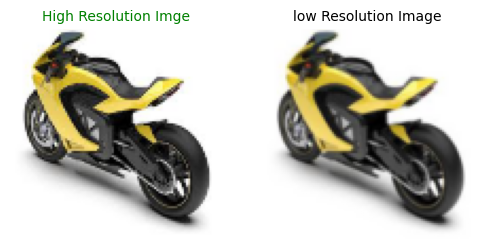

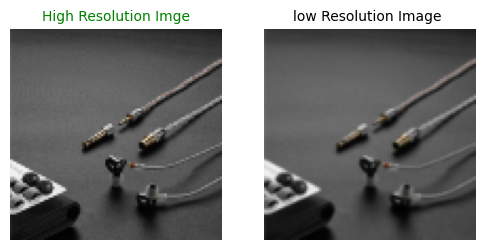

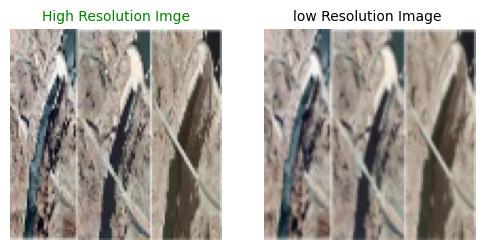

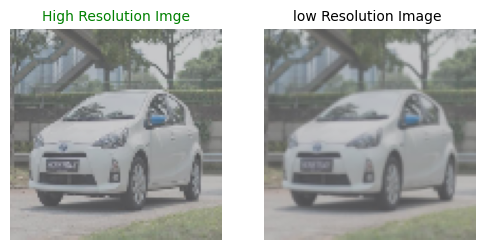

In [26]:
for i in range(4):
    a = np.random.randint(0,100)
    plt.figure(figsize=(6,6))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 10)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 10)
    plt.imshow(low_img[a])
    plt.axis('off')

splittng the dataset into train, validation and test set

In [3]:
train_high_image = high_img[:700]
train_low_image = low_img[:700]
train_high_image = np.array(train_high_image)
train_low_image = np.array(train_low_image)
#train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
#train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[700:830]
validation_low_image = low_img[700:830]
validation_high_image=np.array(validation_high_image)
validation_low_image = np.array(validation_low_image)
#validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
#validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[830:]
test_low_image = low_img[830:]
test_high_image=np.array(test_high_image)
test_low_image=np.array(test_low_image)
#test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
#test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)

Shape of training images: (700, 100, 100, 3)
Shape of test images: (25, 100, 100, 3)
Shape of validation images: (130, 100, 100, 3)


In [4]:
def plot(history):
    plt.plot(history.history['accuracy'], label='accuracy')
    plt.plot(history.history['val_accuracy'], label='val_accuracy')
    plt.legend()
    plt.show()
    
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.legend()
    plt.show()

In [5]:
from math import log10, sqrt
import cv2
import numpy as np
  
def PSNR(y_true, y_pred):
    
    psnr_val = []
    for i in range(len(y_true)):
        mse = np.mean((y_true[i]-y_pred[i]) ** 2)
        if(mse == 0):
            psnr_val.append(100.0)
        else:
            max_pixel = 255.0
            psnr_val.append(20*log10(max_pixel/sqrt(mse)))
        
    return psnr_val


In [6]:
def plot_psnr(x):
    f = plt.figure()
    f.set_size_inches(20,4)
    plt.plot(x, label='PSNR values')
    plt.legend()
    plt.show()
    print('Maximum psnr value:',max(x))
    print('Minimum PSNR value:',min(x))
    avg = sum(x)/len(x)
    print('Average PSNR value:',avg)

In [7]:
def VDSR5(inp):
    lr = Input(shape=(inp))
    c1 = Conv2D(64,(3,3), padding='same')(lr)
    r1 = ReLU()(c1)
    c2 = Conv2D(64,(3,3), padding='same')(r1)
    r2 = ReLU()(c2)
    c3 = Conv2D(64,(3,3), padding='same')(r2)
    r3 = ReLU()(c3)
    c4 = Conv2D(64,(3,3), padding='same')(r3)
    r4 = ReLU()(c4)
    r = Conv2D(1,(3,3), padding='same')(r4)
    out = Add()([lr,r])
    return Model(lr,out)

In [46]:
def plot_output(y_true,y_input,y_pred,x):
    for i in range(3):
        fig, ax = plt.subplots(1,3)
        fig.set_size_inches(8,8)
        fig.set_facecolor('w')

        ax[0].imshow(y_true[i])
        ax[0].set_title('High Resolution Image', fontsize=8)
        ax[0].axis('off')

        ax[1].imshow(y_input[i])
        ax[1].set_title('Low Resolution Image', fontsize=8)
        ax[1].axis('off')

        ax[2].imshow(y_pred[i])
        ax[2].set_title('Predicted Image', fontsize=8)
        ax[2].axis('off')
        plt.axis('off')
        plt.show()
        print('PSNR value',x[i])

In [47]:
def plot_output_final(y_true,y_input,y_pred,x):
    for i in range(len(y_true)):
        fig, ax = plt.subplots(1,3)
        fig.set_size_inches(12,6)
        fig.set_facecolor('w')

        ax[0].imshow(y_true[i])
        ax[0].set_title('High Resolution Image', fontsize=14)
        ax[0].axis('off')

        ax[1].imshow(y_input[i])
        ax[1].set_title('Low Resolution Image', fontsize=14)
        ax[1].axis('off')

        ax[2].imshow(y_pred[i])
        ax[2].set_title('Predicted Image', fontsize=14)
        ax[2].axis('off')
        plt.axis('off')
        plt.show()
        print('PSNR value',x[i])

We create seperate custom models for varying depth rather than using a loop to create the model 
like in the code1 of our project. We did so as we were confident that we could make the 
models without the use of loops

In [48]:
def VDSR10(inp):
    lr = Input(shape=(inp))
    c1 = Conv2D(64,(3,3), padding='same')(lr)
    r1 = ReLU()(c1)
    c2 = Conv2D(64,(3,3), padding='same')(r1)
    r2 = ReLU()(c2)
    c3 = Conv2D(64,(3,3), padding='same')(r2)
    r3 = ReLU()(c3)
    c4 = Conv2D(64,(3,3), padding='same')(r3)
    r4 = ReLU()(c4)
    c5 = Conv2D(64,(3,3), padding='same')(r4)
    r5 = ReLU()(c5)
    c6 = Conv2D(64,(3,3),padding='same')(r5)
    r6 = ReLU()(c6)
    c7 = Conv2D(64,(3,3),padding='same')(r6)
    r7 = ReLU()(c7)
    c8 = Conv2D(64,(3,3),padding='same')(r7)
    r8 = ReLU()(c8)
    c9 = Conv2D(64,(3,3),padding='same')(r8)
    r10 = ReLU()(c9)
    r = Conv2D(1,(3,3), padding='same')(r10)
    out = Add()([lr,r])
    return Model(lr,out)

In [27]:
def VDSR15(inp):
    lr = Input(shape=(inp))
    c1 = Conv2D(64,(3,3), padding='same')(lr)
    r1 = ReLU()(c1)
    c2 = Conv2D(64,(3,3), padding='same')(r1)
    r2 = ReLU()(c2)
    c3 = Conv2D(64,(3,3), padding='same')(r2)
    r3 = ReLU()(c3)
    c4 = Conv2D(64,(3,3), padding='same')(r3)
    r4 = ReLU()(c4)
    c5 = Conv2D(64,(3,3), padding='same')(r4)
    r5 = ReLU()(c5)
    c6 = Conv2D(64,(3,3),padding='same')(r5)
    r6 = ReLU()(c6)
    c7 = Conv2D(64,(3,3),padding='same')(r6)
    r7 = ReLU()(c7)
    c8 = Conv2D(64,(3,3),padding='same')(r7)
    r8 = ReLU()(c8)
    c9 = Conv2D(64,(3,3),padding='same')(r8)
    r10 = ReLU()(c9)
    c10 = Conv2D(64,(3,3), padding='same')(r10)
    r11 = ReLU()(c10)
    c11 = Conv2D(64,(3,3), padding='same')(r11)
    r12 = ReLU()(c11)
    c12 = Conv2D(64,(3,3), padding='same')(r12)
    r13 = ReLU()(c12)
    c13 = Conv2D(64,(3,3), padding='same')(r13)
    r14 = ReLU()(c13)
    c14 = Conv2D(64,(3,3), padding='same')(r14)
    r15 = ReLU()(c14)
    r = Conv2D(1,(3,3), padding='same')(r15)
    out = Add()([lr,r])
    return Model(lr,out)

In [8]:
def VDSR20(inp):
    lr = Input(shape=(inp))
    c1 = Conv2D(64,(3,3), padding='same')(lr)
    r1 = ReLU()(c1)
    c2 = Conv2D(64,(3,3), padding='same')(r1)
    r2 = ReLU()(c2)
    c3 = Conv2D(64,(3,3), padding='same')(r2)
    r3 = ReLU()(c3)
    c4 = Conv2D(64,(3,3), padding='same')(r3)
    r4 = ReLU()(c4)
    c5 = Conv2D(64,(3,3), padding='same')(r4)
    r5 = ReLU()(c5)
    c6 = Conv2D(64,(3,3),padding='same')(r5)
    r6 = ReLU()(c6)
    c7 = Conv2D(64,(3,3),padding='same')(r6)
    r7 = ReLU()(c7)
    c8 = Conv2D(64,(3,3),padding='same')(r7)
    r8 = ReLU()(c8)
    c9 = Conv2D(64,(3,3),padding='same')(r8)
    r10 = ReLU()(c9)
    c10 = Conv2D(64,(3,3), padding='same')(r10)
    r11 = ReLU()(c10)
    c11 = Conv2D(64,(3,3), padding='same')(r11)
    r12 = ReLU()(c11)
    c12 = Conv2D(64,(3,3), padding='same')(r12)
    r13 = ReLU()(c12)
    c13 = Conv2D(64,(3,3), padding='same')(r13)
    r14 = ReLU()(c13)
    c14 = Conv2D(64,(3,3), padding='same')(r14)
    r15 = ReLU()(c14)
    c15 = Conv2D(64,(3,3), padding='same')(r15)
    r16 = ReLU()(c15)
    c16 = Conv2D(64,(3,3), padding='same')(r16)
    r17 = ReLU()(c16)
    c17 = Conv2D(64,(3,3), padding='same')(r17)
    r18 = ReLU()(c17)
    c18 = Conv2D(64,(3,3), padding='same')(r18)
    r19 = ReLU()(c18)
    c19 = Conv2D(64,(3,3), padding='same')(r19)
    r20 = ReLU()(c19) 
    r = Conv2D(1,(3,3), padding='same')(r20)
    out = Add()([lr,r])
    return Model(lr,out)

## Layer 5 model and training

In [18]:
inp = train_high_image.shape[1:]
model_l5 = VDSR5(inp)
model_l5.summary()
model_l5.compile(optimizer=Adam(learning_rate=0.0001,beta_1=0.9), loss='mse', metrics=['accuracy'])

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 100, 100, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 100, 100, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
re_lu (ReLU)                    (None, 100, 100, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 100, 100, 64) 36928       re_lu[0][0]                      
______________________________________________________________________________________________

We were unable to run the following code as image size was 256x256. Don't run the in below cell

In [ ]:
result_ml5 = model_l5.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=5)

In [19]:
result_ml5 = model_l5.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=10)

Epoch 1/10
22/22 [==============================] - 9s 91ms/step - loss: 0.0018 - accuracy: 0.9683 - val_loss: 0.0012 - val_accuracy: 0.9701
Epoch 2/10
22/22 [==============================] - 1s 49ms/step - loss: 0.0011 - accuracy: 0.9683 - val_loss: 0.0010 - val_accuracy: 0.9701
Epoch 3/10
22/22 [==============================] - 1s 49ms/step - loss: 9.5752e-04 - accuracy: 0.9683 - val_loss: 9.0476e-04 - val_accuracy: 0.9701
Epoch 4/10
22/22 [==============================] - 1s 49ms/step - loss: 8.4008e-04 - accuracy: 0.9683 - val_loss: 7.9264e-04 - val_accuracy: 0.9701
Epoch 5/10
22/22 [==============================] - 1s 48ms/step - loss: 7.4388e-04 - accuracy: 0.9683 - val_loss: 7.2055e-04 - val_accuracy: 0.9701
Epoch 6/10
22/22 [==============================] - 1s 49ms/step - loss: 6.8317e-04 - accuracy: 0.9683 - val_loss: 6.7385e-04 - val_accuracy: 0.9701
Epoch 7/10
22/22 [==============================] - 1s 49ms/step - loss: 6.4187e-04 - accuracy: 0.9683 - val_loss: 6.4181e

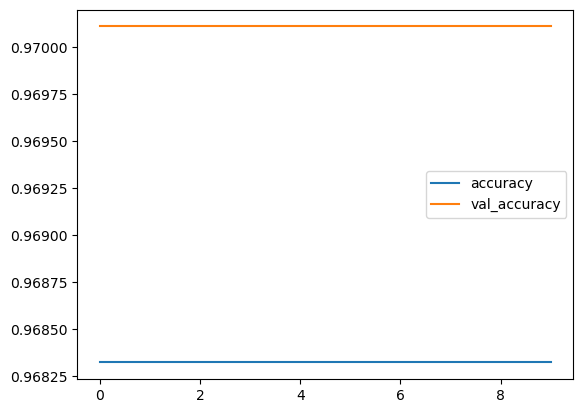

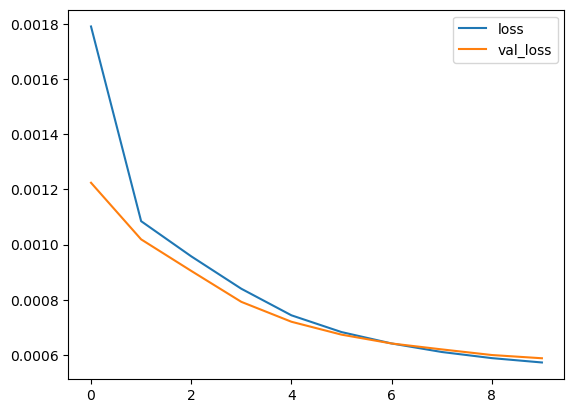

In [20]:
plot(result_ml5)


Results of 5 layer model for test set

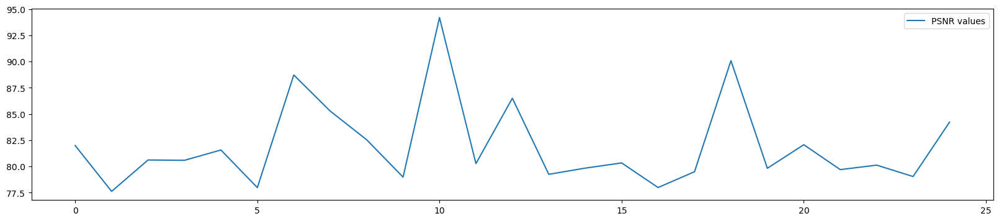

Maximum psnr value: 94.19227506195163
Minimum PSNR value: 77.62178609938891
Average PSNR value: 81.95185692865257


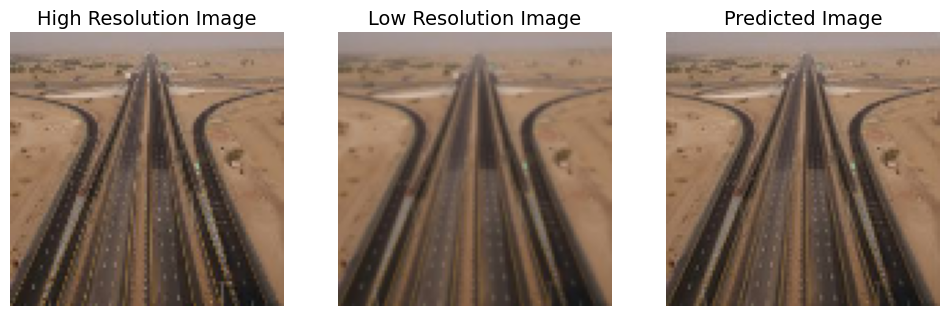

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 81.98996161541376


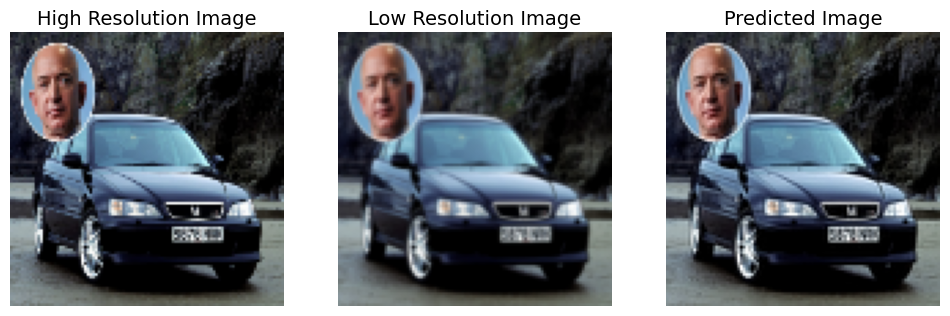

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 77.62178609938891


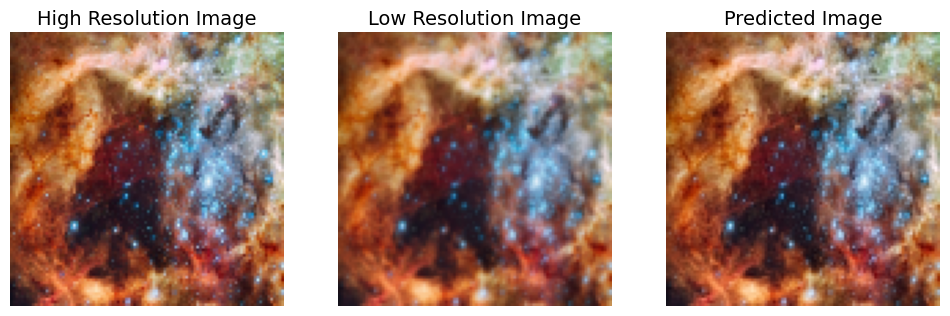

PSNR value 80.61574171292978


In [21]:
ml_5_pred = model_l5.predict(test_low_image)
ml_5_psnr = PSNR(test_high_image,ml_5_pred)
plot_psnr(ml_5_psnr)
plot_output(test_high_image,test_low_image,ml_5_pred,ml_5_psnr)

## Layer 10 model and training

In [22]:
model_l10 = VDSR10(inp)
model_l10.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 100, 100, 3) 0                                            
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 100, 100, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
re_lu_4 (ReLU)                  (None, 100, 100, 64) 0           conv2d_5[0][0]                   
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 100, 100, 64) 36928       re_lu_4[0][0]                    
____________________________________________________________________________________________

In [23]:
model_l10.compile(optimizer=Adam(learning_rate=0.0005,beta_1=0.9), loss='mse', metrics=['accuracy'])

Epoch 1/10
22/22 [==============================] - 3s 115ms/step - loss: 0.0011 - accuracy: 0.9683 - val_loss: 0.0010 - val_accuracy: 0.9701
Epoch 2/10
22/22 [==============================] - 2s 110ms/step - loss: 9.3895e-04 - accuracy: 0.9683 - val_loss: 8.0414e-04 - val_accuracy: 0.9701
Epoch 3/10
22/22 [==============================] - 2s 109ms/step - loss: 7.3277e-04 - accuracy: 0.9683 - val_loss: 6.8404e-04 - val_accuracy: 0.9701
Epoch 4/10
22/22 [==============================] - 2s 110ms/step - loss: 6.2884e-04 - accuracy: 0.9683 - val_loss: 6.0974e-04 - val_accuracy: 0.9701
Epoch 5/10
22/22 [==============================] - 2s 110ms/step - loss: 5.6890e-04 - accuracy: 0.9683 - val_loss: 5.7425e-04 - val_accuracy: 0.9701
Epoch 6/10
22/22 [==============================] - 2s 110ms/step - loss: 5.5879e-04 - accuracy: 0.9683 - val_loss: 5.7129e-04 - val_accuracy: 0.9701
Epoch 7/10
22/22 [==============================] - 2s 110ms/step - loss: 5.4642e-04 - accuracy: 0.9683 - va

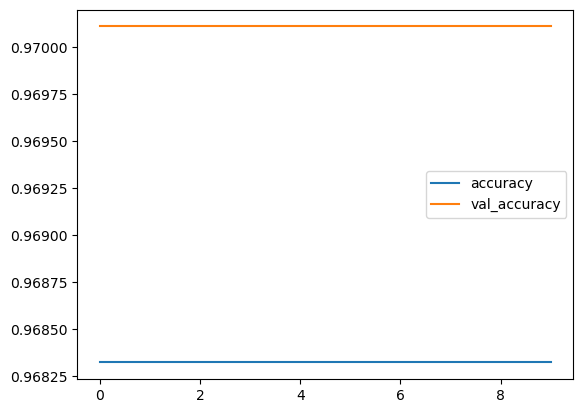

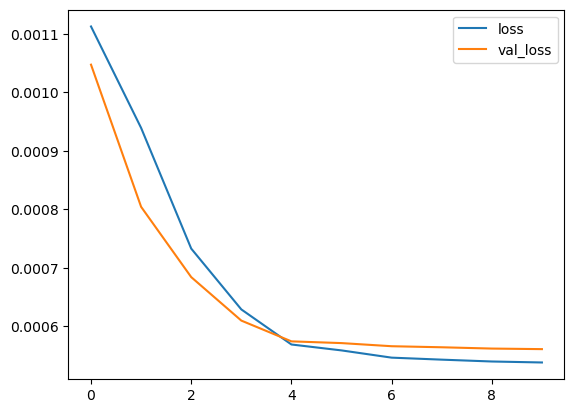

In [24]:
result_ml10 = model_l10.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=10)
plot(result_ml10)

Results of 10 layer model for test set

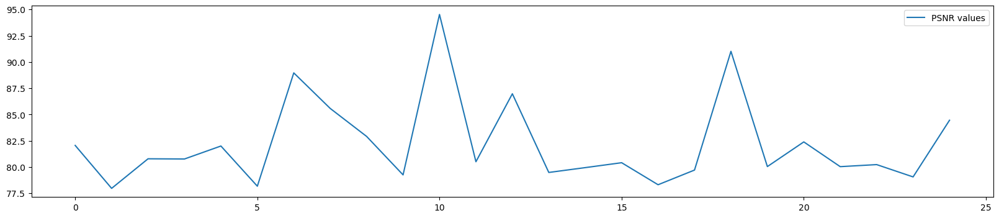

Maximum psnr value: 94.52585184538634
Minimum PSNR value: 77.96944144935829
Average PSNR value: 82.22284161828495


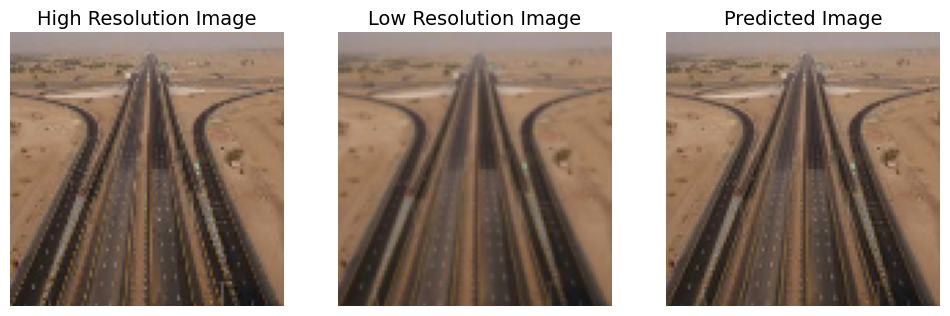

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 82.05784627455509


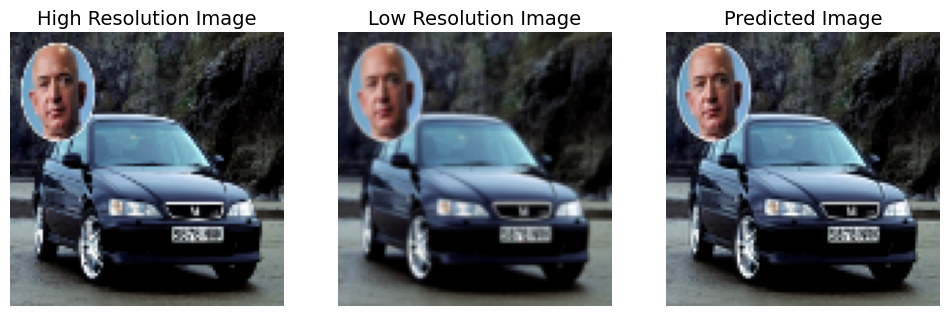

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 77.96944144935829


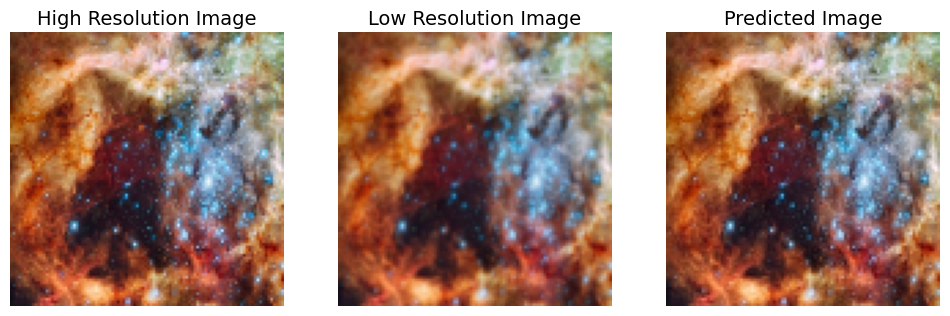

PSNR value 80.78503817478736


In [25]:
ml_10_pred = model_l10.predict(test_low_image)
ml_10_psnr = PSNR(test_high_image,ml_10_pred)
plot_psnr(ml_10_psnr)
plot_output(test_high_image,test_low_image,ml_10_pred,ml_10_psnr)

## Layer 15 model and training

In [28]:
model_l15=VDSR15(inp)
model_l15.summary()
model_l15.compile(optimizer=Adam(learning_rate=0.0007,beta_1=0.9), loss='mse', metrics=['accuracy'])

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 100, 100, 3) 0                                            
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, 100, 100, 64) 1792        input_3[0][0]                    
__________________________________________________________________________________________________
re_lu_13 (ReLU)                 (None, 100, 100, 64) 0           conv2d_15[0][0]                  
__________________________________________________________________________________________________
conv2d_16 (Conv2D)              (None, 100, 100, 64) 36928       re_lu_13[0][0]                   
____________________________________________________________________________________________

Epoch 1/10
22/22 [==============================] - 5s 177ms/step - loss: 0.0011 - accuracy: 0.9683 - val_loss: 0.0011 - val_accuracy: 0.9701
Epoch 2/10
22/22 [==============================] - 4s 171ms/step - loss: 0.0010 - accuracy: 0.9683 - val_loss: 9.9257e-04 - val_accuracy: 0.9701
Epoch 3/10
22/22 [==============================] - 4s 170ms/step - loss: 9.8349e-04 - accuracy: 0.9683 - val_loss: 9.3912e-04 - val_accuracy: 0.9701
Epoch 4/10
22/22 [==============================] - 4s 170ms/step - loss: 9.4761e-04 - accuracy: 0.9683 - val_loss: 8.6647e-04 - val_accuracy: 0.9701
Epoch 5/10
22/22 [==============================] - 4s 169ms/step - loss: 7.8821e-04 - accuracy: 0.9683 - val_loss: 7.2628e-04 - val_accuracy: 0.9701
Epoch 6/10
22/22 [==============================] - 4s 170ms/step - loss: 6.8777e-04 - accuracy: 0.9683 - val_loss: 6.7550e-04 - val_accuracy: 0.9701
Epoch 7/10
22/22 [==============================] - 4s 170ms/step - loss: 6.4554e-04 - accuracy: 0.9683 - val_lo

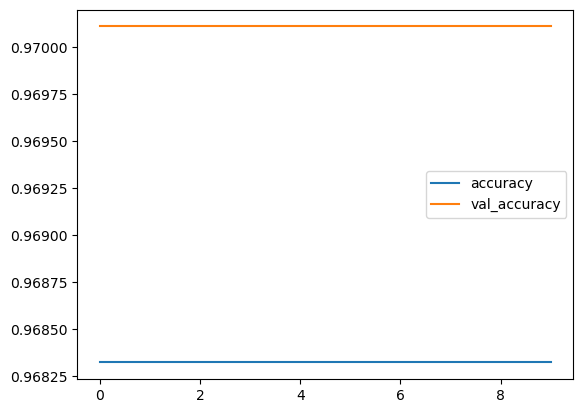

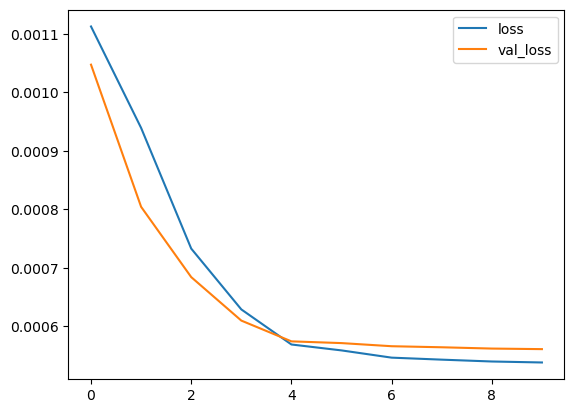

In [29]:
result_ml15 = model_l15.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=10)
plot(result_ml15)

Results of 15 layer model for test set

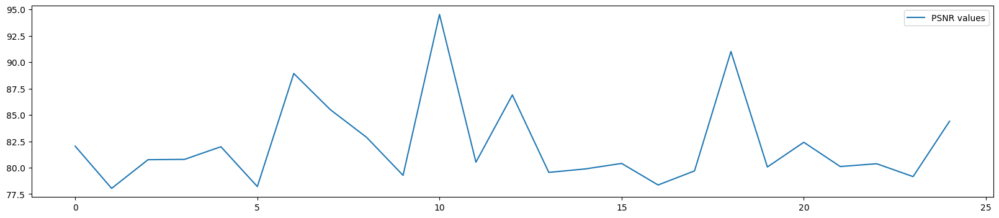

Maximum psnr value: 94.5279913729024
Minimum PSNR value: 78.04142831254168
Average PSNR value: 82.23253825927748


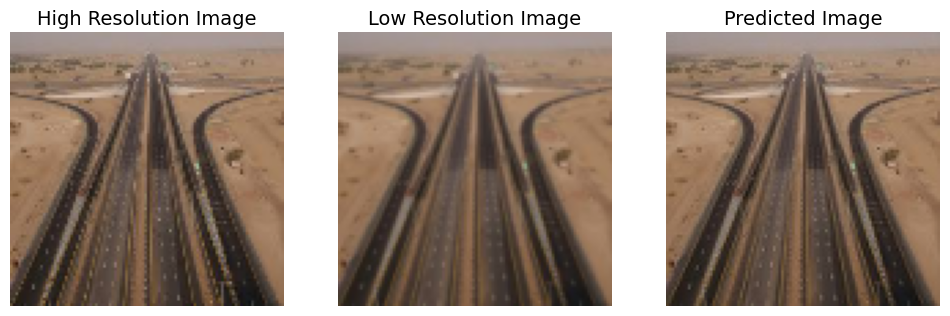

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 82.04015788866411


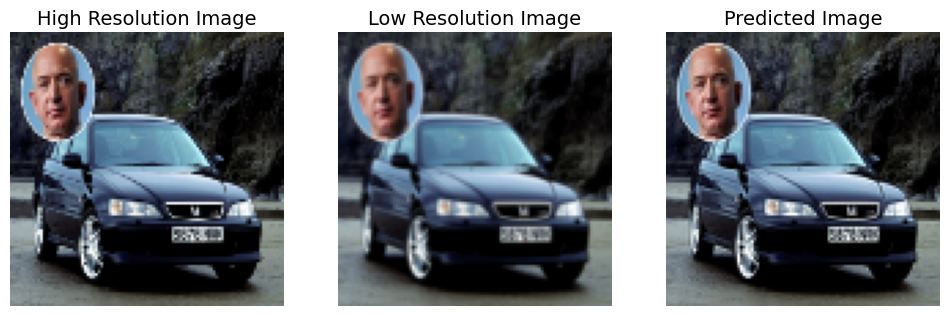

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 78.04142831254168


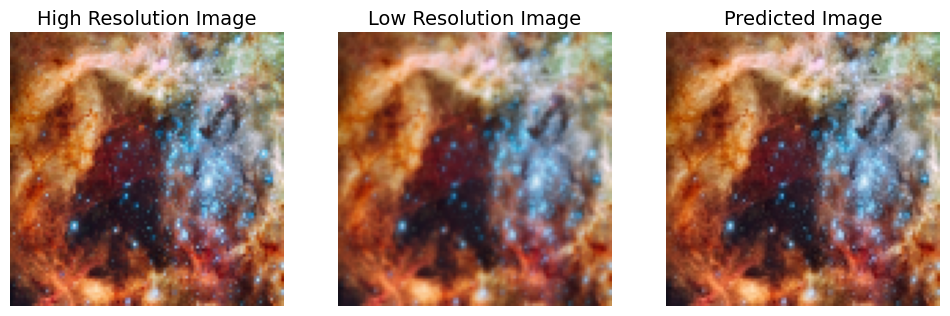

PSNR value 80.75875336798927


In [30]:
ml_15_pred = model_l15.predict(test_low_image)
ml_15_psnr = PSNR(test_high_image,ml_15_pred)
plot_psnr(ml_15_psnr)
plot_output(test_high_image,test_low_image,ml_15_pred,ml_15_psnr)

## Layer 20 model and training

In [68]:
model_l20 = VDSR20(inp)
model_l20.summary()
model_l20.compile(optimizer=Adam(learning_rate=0.0009,beta_1=0.9), loss='mse', metrics=['accuracy'])

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 100, 100, 3) 0                                            
__________________________________________________________________________________________________
conv2d_60 (Conv2D)              (None, 100, 100, 64) 1792        input_6[0][0]                    
__________________________________________________________________________________________________
re_lu_55 (ReLU)                 (None, 100, 100, 64) 0           conv2d_60[0][0]                  
__________________________________________________________________________________________________
conv2d_61 (Conv2D)              (None, 100, 100, 64) 36928       re_lu_55[0][0]                   
____________________________________________________________________________________________

Epoch 1/10
22/22 [==============================] - 7s 253ms/step - loss: 0.0011 - accuracy: 0.9683 - val_loss: 0.0011 - val_accuracy: 0.9701
Epoch 2/10
22/22 [==============================] - 5s 231ms/step - loss: 0.0011 - accuracy: 0.9683 - val_loss: 0.0011 - val_accuracy: 0.9701
Epoch 3/10
22/22 [==============================] - 5s 231ms/step - loss: 0.0010 - accuracy: 0.9683 - val_loss: 0.0010 - val_accuracy: 0.9701
Epoch 4/10
22/22 [==============================] - 5s 231ms/step - loss: 9.3432e-04 - accuracy: 0.9683 - val_loss: 8.6087e-04 - val_accuracy: 0.9701
Epoch 5/10
22/22 [==============================] - 5s 231ms/step - loss: 8.2807e-04 - accuracy: 0.9683 - val_loss: 7.7003e-04 - val_accuracy: 0.9701
Epoch 6/10
22/22 [==============================] - 5s 231ms/step - loss: 7.0253e-04 - accuracy: 0.9683 - val_loss: 6.9889e-04 - val_accuracy: 0.9701
Epoch 7/10
22/22 [==============================] - 5s 231ms/step - loss: 6.2568e-04 - accuracy: 0.9683 - val_loss: 6.0297e-

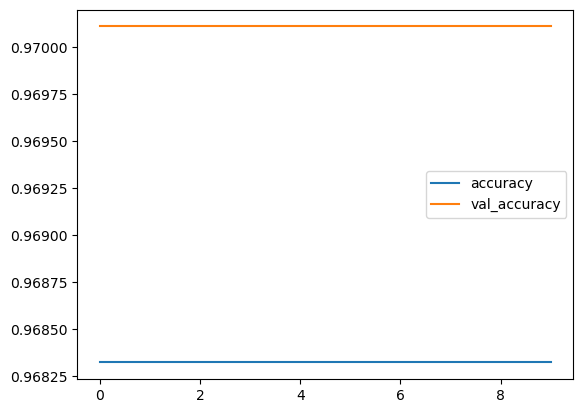

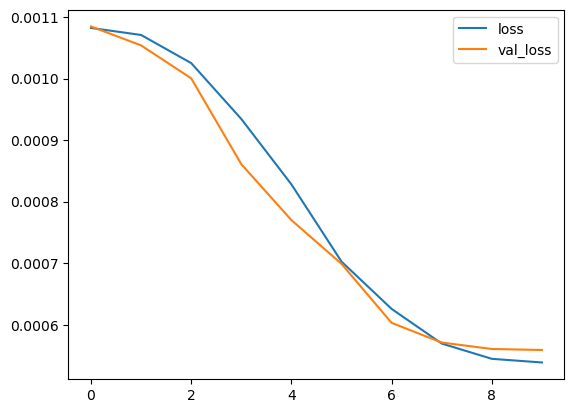

In [69]:
result_ml20 = model_l20.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=10)
plot(result_ml20)

Results of 20 layer model for test set

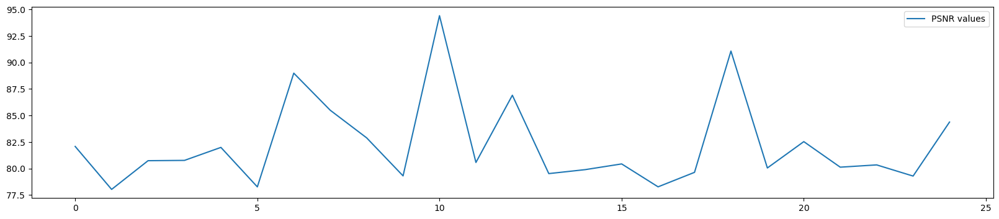

Maximum psnr value: 94.41647871441019
Minimum PSNR value: 78.02908746185197
Average PSNR value: 82.24007084432304


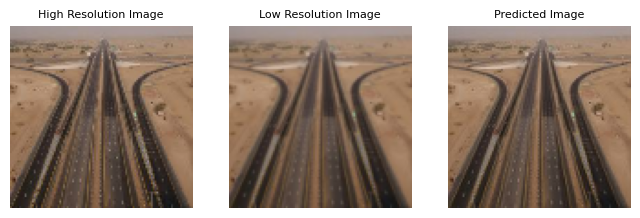

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 82.08008428346795


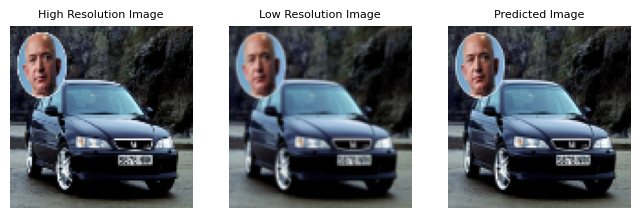

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 78.02908746185197


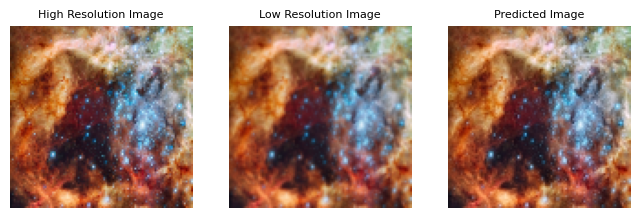

PSNR value 80.73586079821227


In [70]:
ml_20_pred = model_l20.predict(test_low_image)
ml_20_psnr = PSNR(test_high_image,ml_20_pred)
plot_psnr(ml_20_psnr)
plot_output(test_high_image,test_low_image,ml_20_pred,ml_20_psnr)

Function to load Set5 dataset, resizing as well as creating low resolution images on which predictions would be made. 
Setting the scale factor = 2

In [58]:
def load_set5(scale,size):
    r_size=int(size/scale)
    set5_inp = []
    path = 'C:/Users/sahil/Downloads/data_set5/Set5/Set5/Input'
    files = os.listdir(path)
    for i in tqdm(files):       
            img = cv2.imread(path + '/'+i,1)
            # open cv reads images in BGR format so we have to convert it to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #resizing image
            img = cv2.resize(img, (r_size, r_size))
            img = img.astype('float32') / 255.0
            set5_inp.append(img)
    set5_inp=np.array(set5_inp)
    set5_out = []
    path = 'C:/Users/sahil/Downloads/data_set5/Set5/Set5/Truth'
    files = os.listdir(path)
    for i in tqdm(files):       
            img = cv2.imread(path + '/'+i,1)
            # open cv reads images in BGR format so we have to convert it to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #resizing image
            img = cv2.resize(img, (size, size))
            img = img.astype('float32') / 255.0
            set5_out.append(img)
    set5_out=np.array(set5_out)
    set5_inp=tf.convert_to_tensor(set5_inp)
    set5_inp=resize_images(set5_inp,scale,scale,'channels_last',interpolation='bilinear')
    return set5_inp,set5_out

In [62]:
set5_inp,set5_out = load_set5(2,100)
print('Set5 input shape',set5_inp.shape)
print('Set5 output shape',set5_out.shape)

100%|██████████| 5/5 [00:00<00:00, 356.73it/s]

Set5 input shape (5, 100, 100, 3)
Set5 output shape (5, 100, 100, 3)


## Evaluating the previously trained models on Set5

In [54]:
model_l15=VDSR15(inp)
model_l5.compile(optimizer=Adam(learning_rate=0.0001,beta_1=0.9), loss='mse', metrics=['accuracy'])
model_l5.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=10,verbose=2)
model_l5.save_weights('Layer_5_weights.h5')
pred_l5 = model_l5.predict(set5_inp)

Epoch 1/10
22/22 - 2s - loss: 6.5444e-04 - accuracy: 0.9683 - val_loss: 6.1332e-04 - val_accuracy: 0.9701
Epoch 2/10
22/22 - 1s - loss: 5.7481e-04 - accuracy: 0.9683 - val_loss: 5.8866e-04 - val_accuracy: 0.9701
Epoch 3/10
22/22 - 1s - loss: 5.6465e-04 - accuracy: 0.9683 - val_loss: 5.8368e-04 - val_accuracy: 0.9701
Epoch 4/10
22/22 - 1s - loss: 5.6031e-04 - accuracy: 0.9683 - val_loss: 5.8093e-04 - val_accuracy: 0.9701
Epoch 5/10
22/22 - 1s - loss: 5.5737e-04 - accuracy: 0.9683 - val_loss: 5.7846e-04 - val_accuracy: 0.9701
Epoch 6/10
22/22 - 1s - loss: 5.5482e-04 - accuracy: 0.9683 - val_loss: 5.7639e-04 - val_accuracy: 0.9701
Epoch 7/10
22/22 - 1s - loss: 5.5264e-04 - accuracy: 0.9683 - val_loss: 5.7465e-04 - val_accuracy: 0.9701
Epoch 8/10
22/22 - 1s - loss: 5.5076e-04 - accuracy: 0.9683 - val_loss: 5.7303e-04 - val_accuracy: 0.9701
Epoch 9/10
22/22 - 1s - loss: 5.4897e-04 - accuracy: 0.9683 - val_loss: 5.7166e-04 - val_accuracy: 0.9701
Epoch 10/10
22/22 - 1s - loss: 5.4749e-04 - ac

## Layer 5 model

In [55]:
psnr_l5 = PSNR(set5_out,pred_l5)

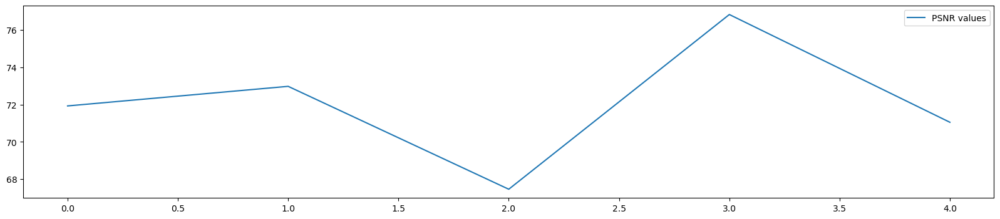

Maximum psnr value: 76.82350719754461
Minimum PSNR value: 67.46321202290873
Average PSNR value: 72.04777329875927


In [56]:
plot_psnr(psnr_l5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


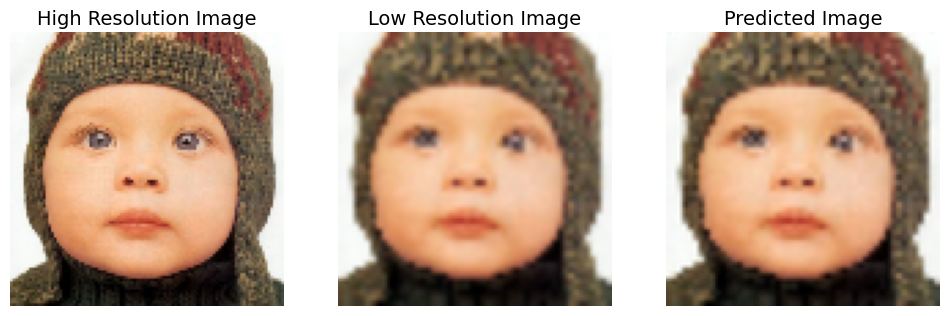

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 71.92662860635079


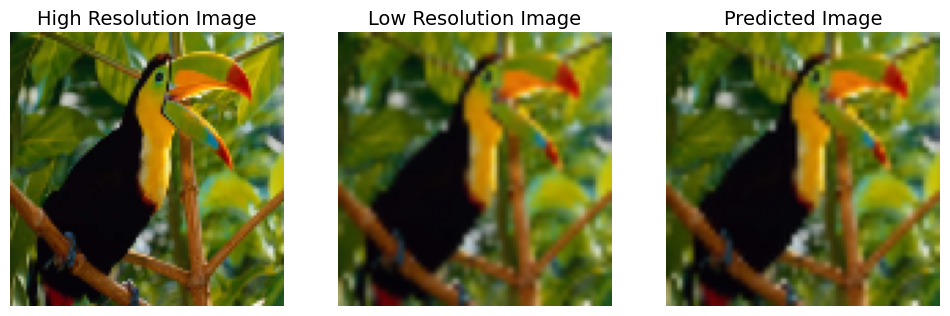

PSNR value 72.97550751549244


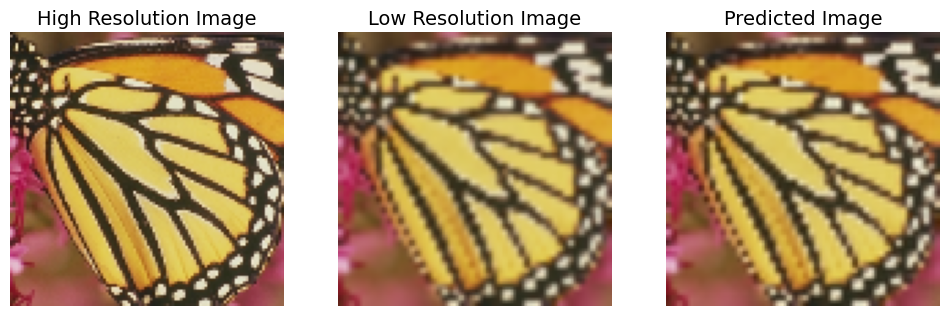

PSNR value 67.46321202290873


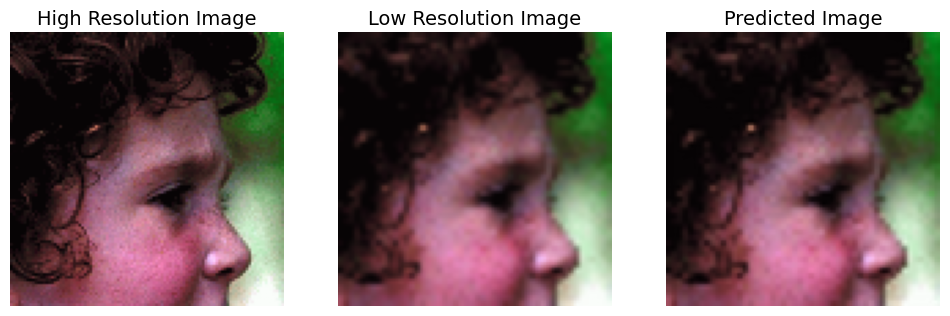

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 76.82350719754461


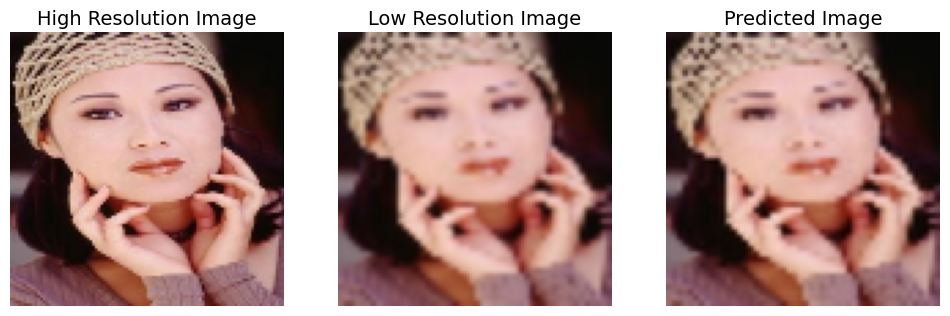

PSNR value 71.05001115149967


In [57]:
plot_output_final(set5_out,set5_inp,pred_l5,psnr_l5)

## Layer 10 model

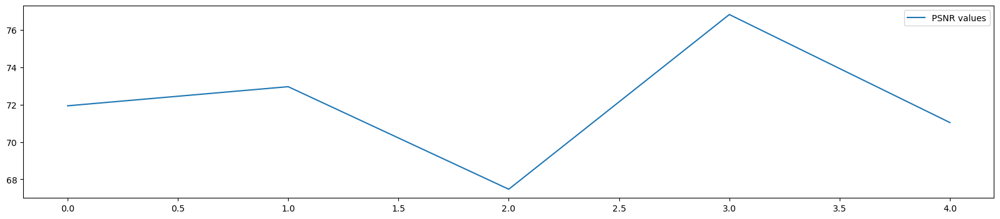

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 76.83099023408647
Minimum PSNR value: 67.46807878931378
Average PSNR value: 72.0485211665302


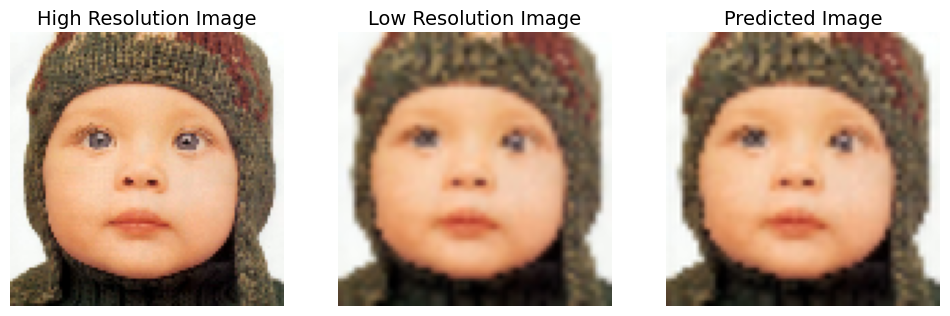

PSNR value 71.93877223976742


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


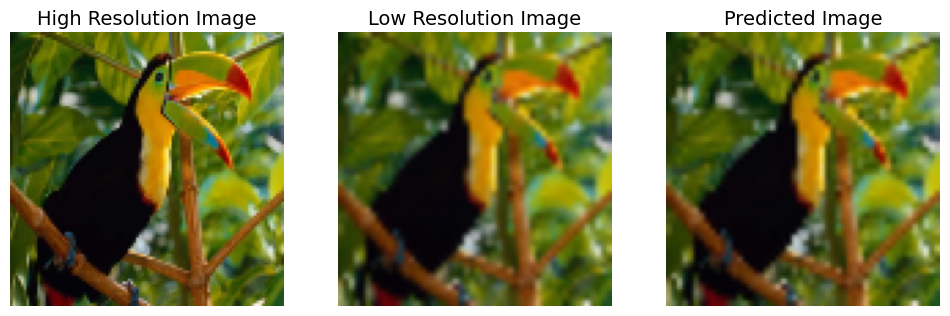

PSNR value 72.96358478120969


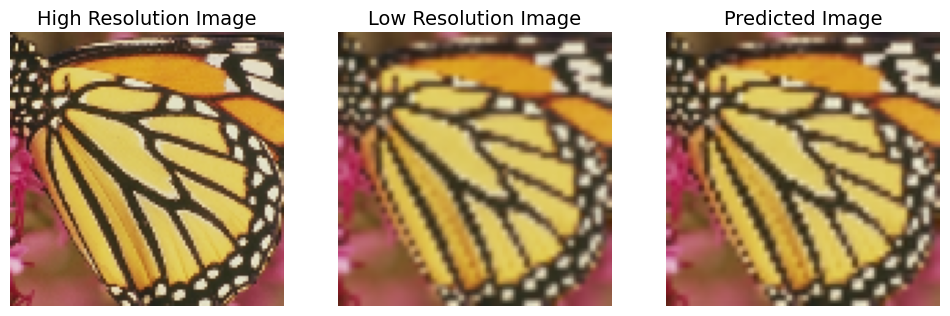

PSNR value 67.46807878931378


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


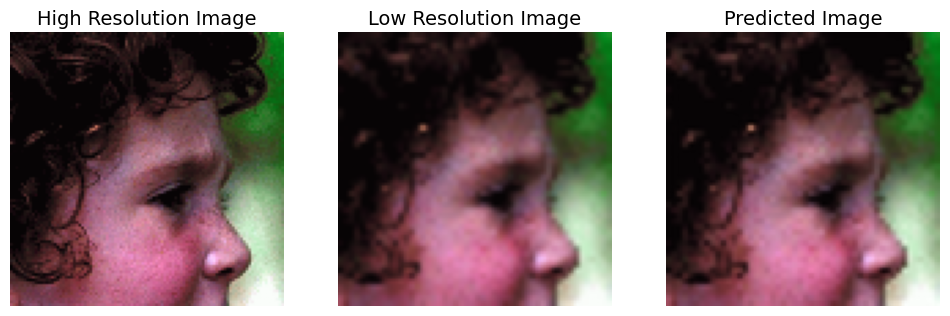

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 76.83099023408647


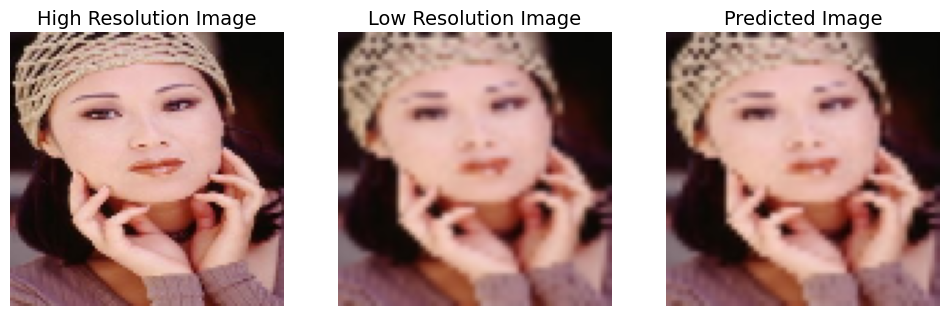

PSNR value 71.04117978827361


In [50]:
pred_l10 = model_l10.predict(set5_inp)
psnr_l10 = PSNR(set5_out,pred_l10)
plot_psnr(psnr_l10)
plot_output_final(set5_out,set5_inp,pred_l10,psnr_l10)

## Layer 15 model

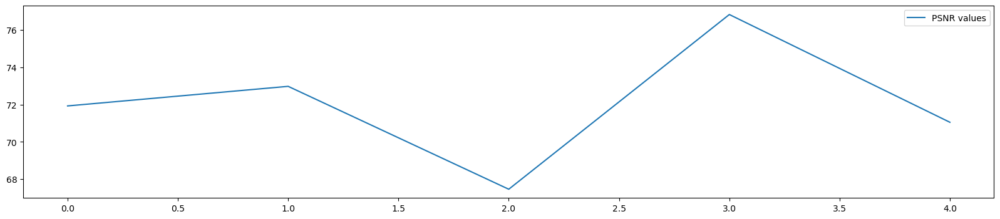

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 76.82350719754461
Minimum PSNR value: 67.46321202290873
Average PSNR value: 72.04777329875927


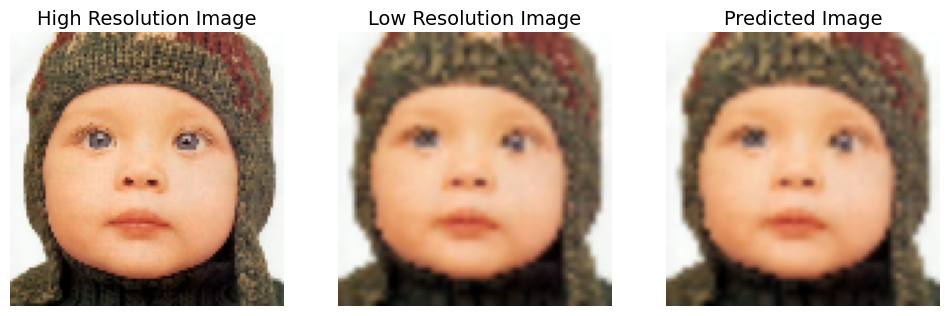

PSNR value 71.92662860635079


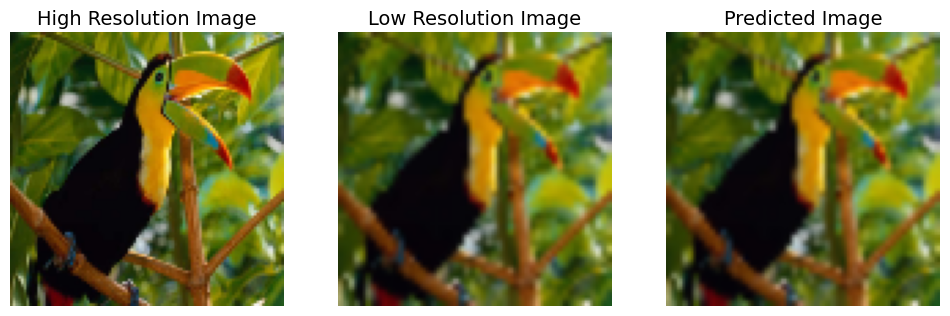

PSNR value 72.97550751549244


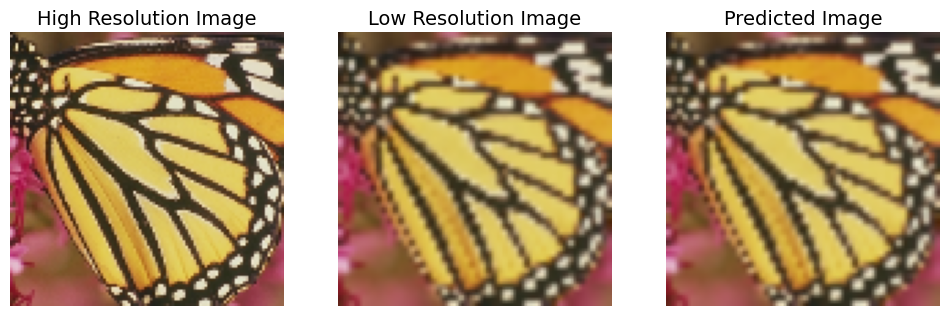

PSNR value 67.46321202290873


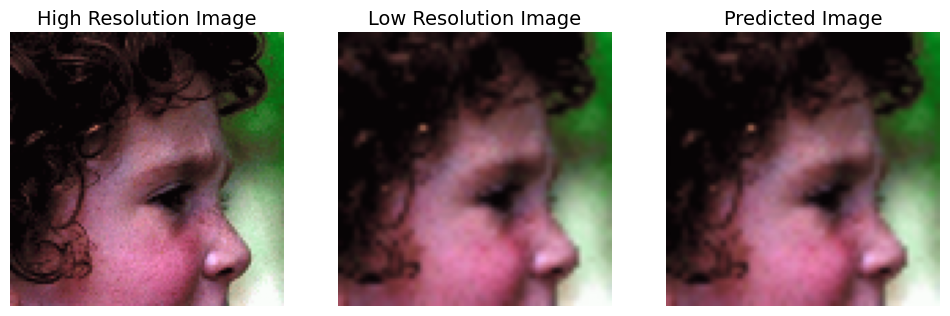

PSNR value 76.82350719754461


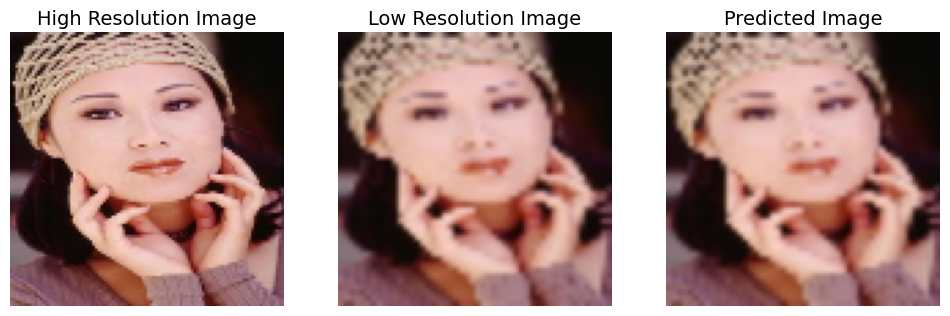

PSNR value 71.05001115149967


In [65]:
pred_l15 = model_l15.predict(set5_inp)
psnr_l15 = PSNR(set5_out,pred_l5)
plot_psnr(psnr_l15)
plot_output_final(set5_out,set5_inp,pred_l15,psnr_l15)

## Layer 20 model

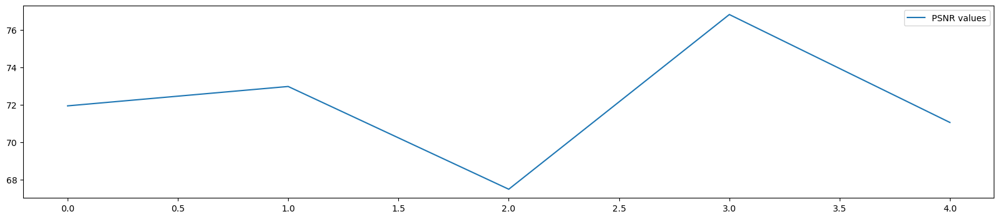

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 76.82599349665594
Minimum PSNR value: 67.474225561178
Average PSNR value: 72.0518834899664


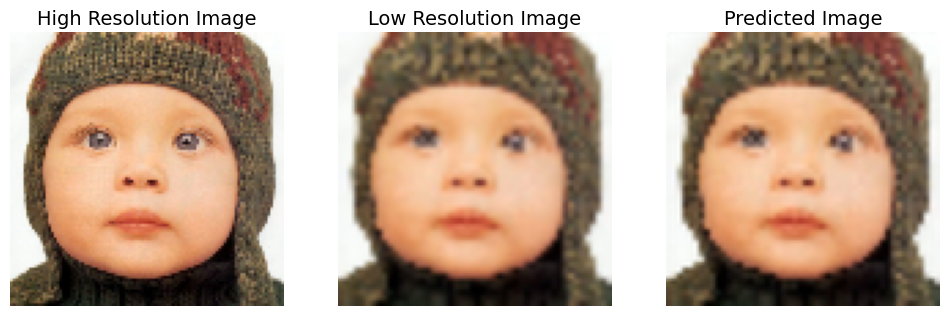

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 71.93669695780186


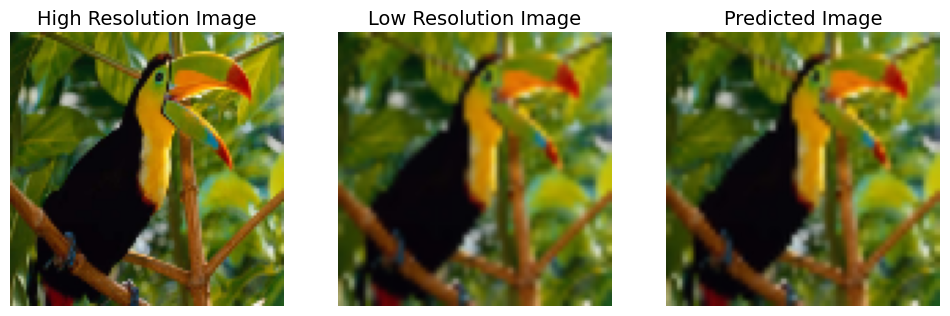

PSNR value 72.97454779036701


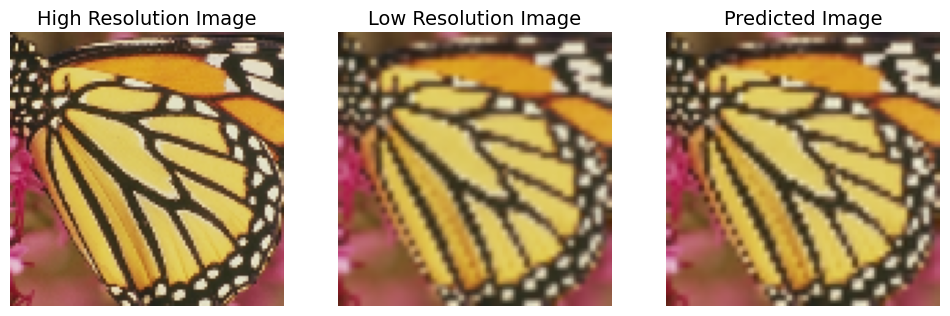

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 67.474225561178


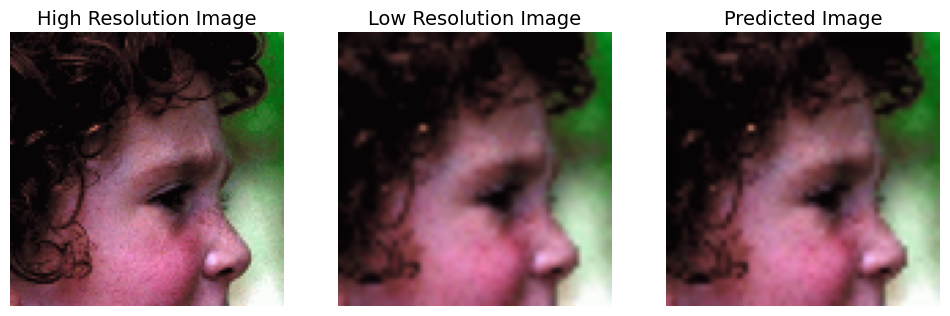

PSNR value 76.82599349665594


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


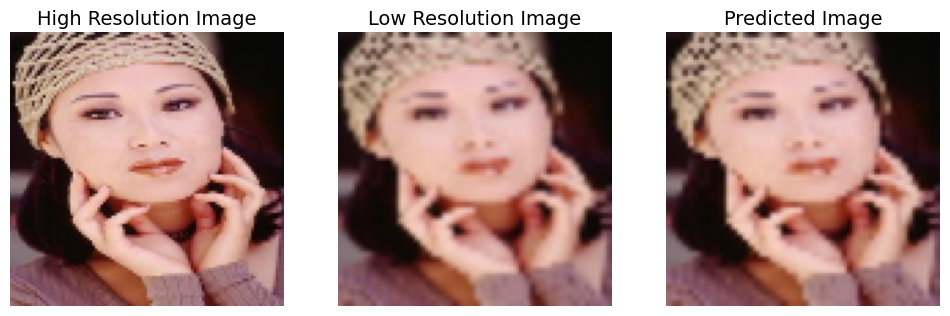

PSNR value 71.0479536438292


In [71]:
pred_l20 = model_l20.predict(set5_inp)
psnr_l20 = PSNR(set5_out,pred_l20)
plot_psnr(psnr_l20)
plot_output_final(set5_out,set5_inp,pred_l20,psnr_l20)

In [60]:
set5_inp_4,set5_out_4 = load_set5(4,100)
print('Set5 input shape',set5_inp.shape)
print('Set5 output shape',set5_out.shape)

100%|██████████| 5/5 [00:00<00:00, 354.79it/s]

Set5 input shape (5, 100, 100, 3)
Set5 output shape (5, 100, 100, 3)


Scale Factor = 4

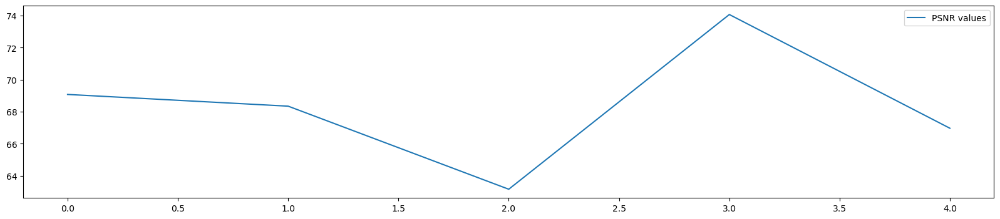

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 74.06652240717807
Minimum PSNR value: 63.162935273971286
Average PSNR value: 68.32465337502059


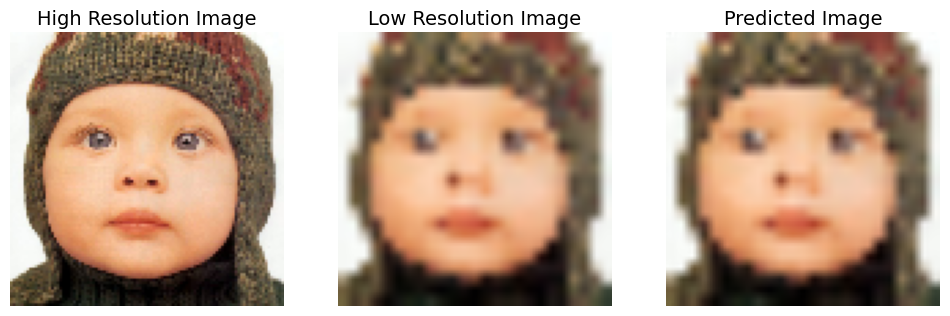

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 69.07857529337036


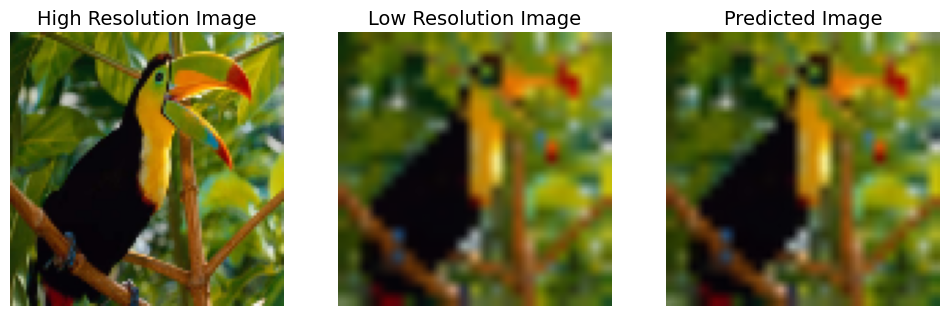

PSNR value 68.347141406837


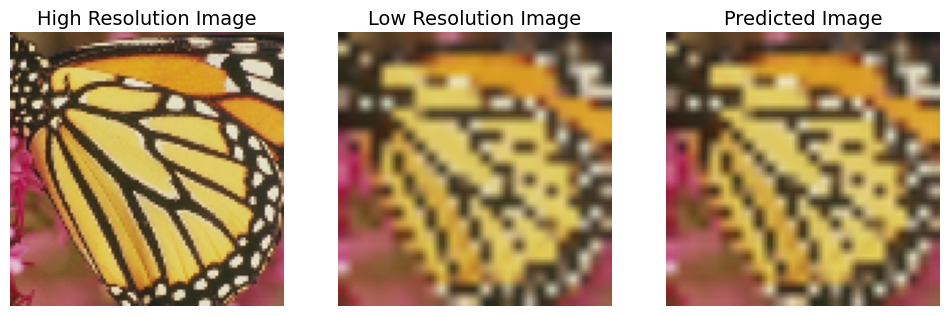

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 63.162935273971286


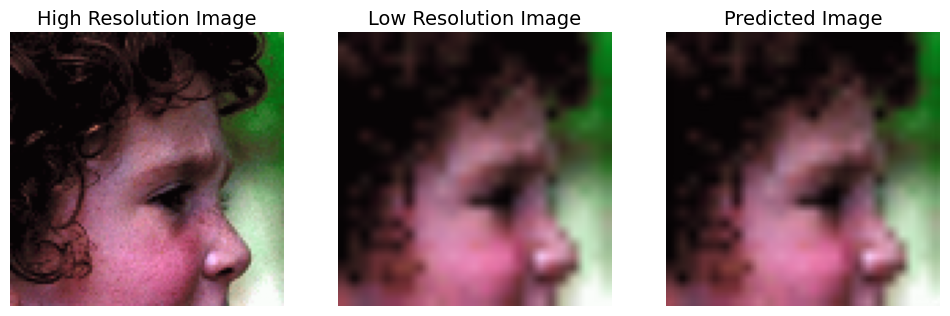

PSNR value 74.06652240717807


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


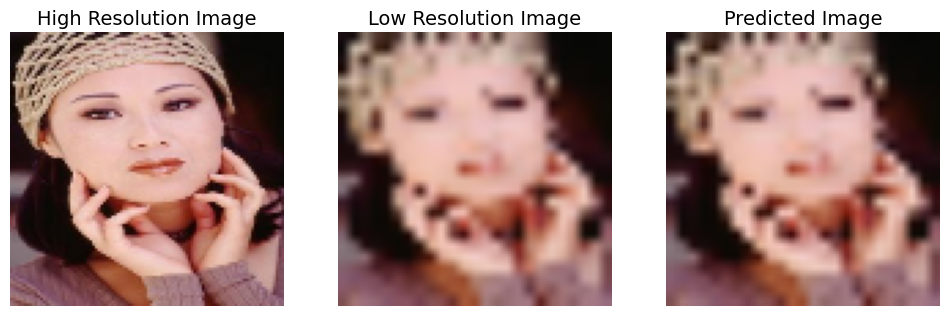

PSNR value 66.96809249374623


In [61]:
pred_l5_4 = model_l5.predict(set5_inp_4)
psnr_l5_4 = PSNR(set5_out_4,pred_l5_4)
plot_psnr(psnr_l5_4)
plot_output_final(set5_out_4,set5_inp_4,pred_l5_4,psnr_l5_4)

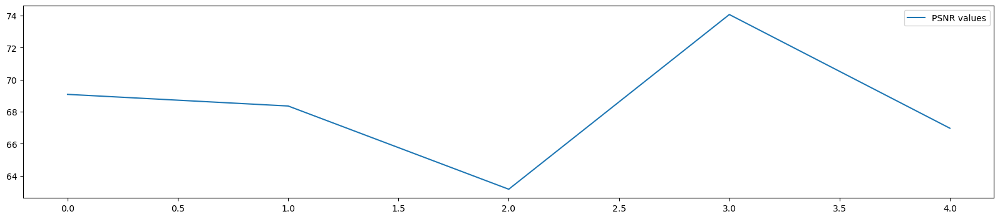

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 74.06402548405582
Minimum PSNR value: 63.165772017120645
Average PSNR value: 68.32801593444911


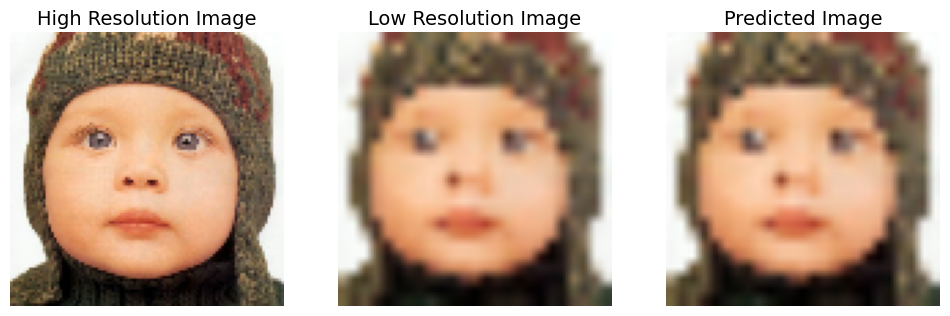

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 69.08304569951157


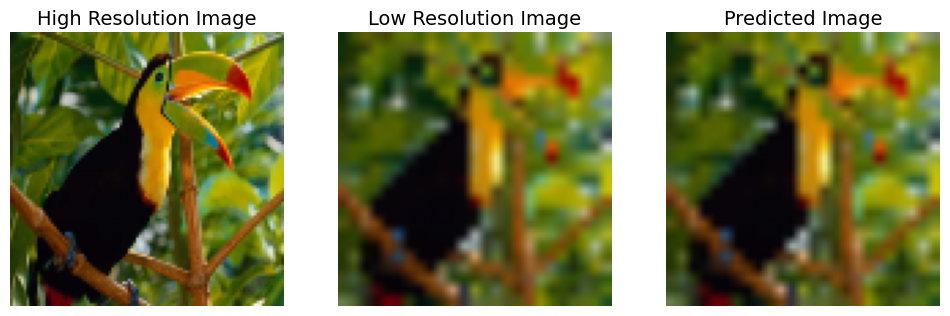

PSNR value 68.35742548108429


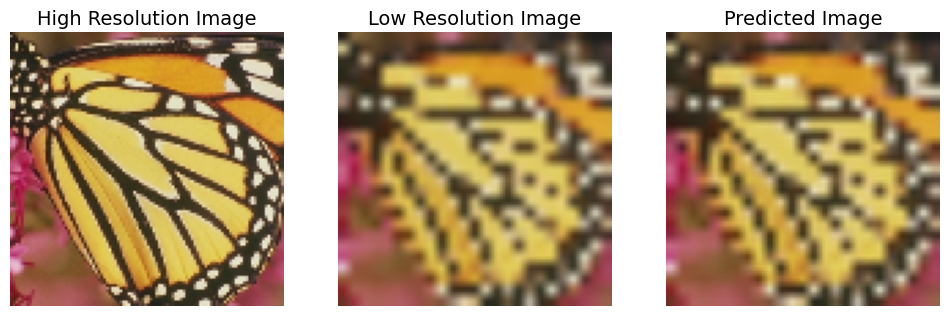

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 63.165772017120645


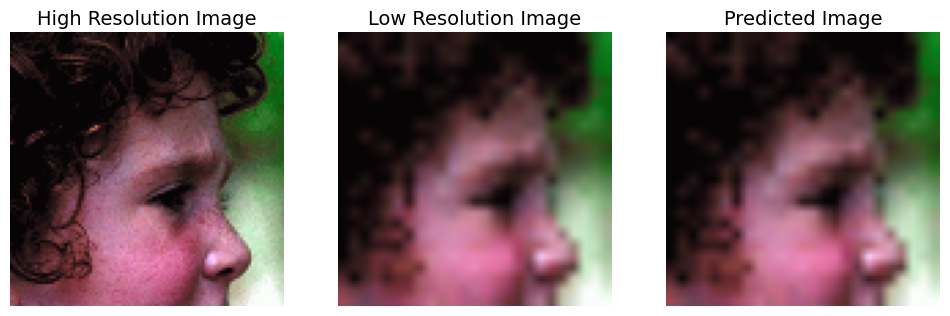

PSNR value 74.06402548405582


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


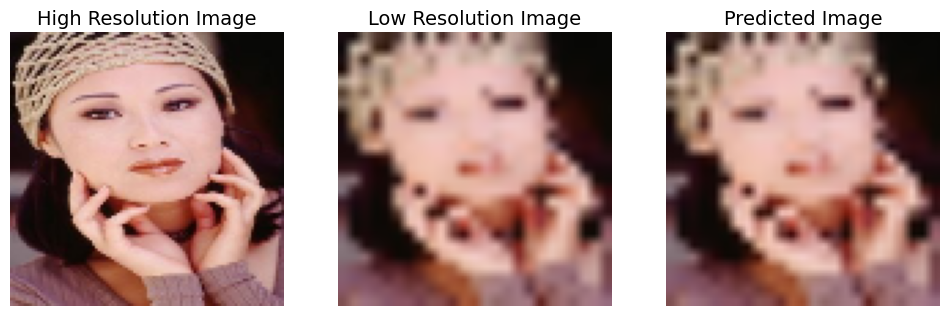

PSNR value 66.96981099047326


In [63]:
pred_l10_4 = model_l10.predict(set5_inp_4)
psnr_l10_4 = PSNR(set5_out_4,pred_l10_4)
plot_psnr(psnr_l10_4)
plot_output_final(set5_out_4,set5_inp_4,pred_l10_4,psnr_l10_4)

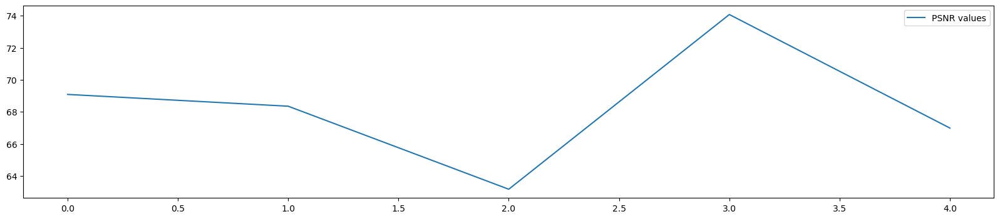

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 74.07342386808911
Minimum PSNR value: 63.17185441666433
Average PSNR value: 68.33492041564702


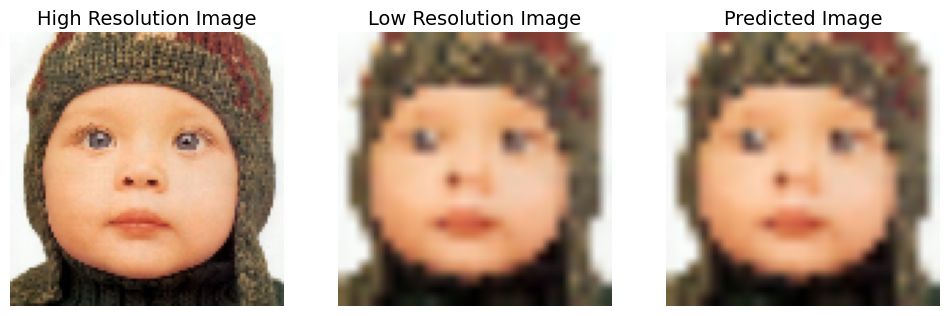

PSNR value 69.08802387865634


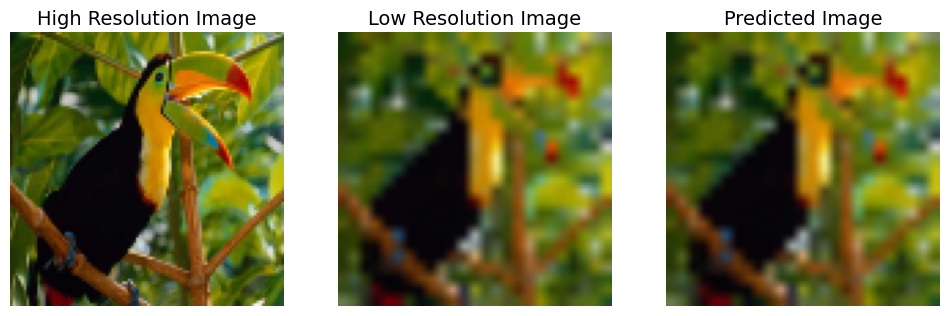

PSNR value 68.35256345298282


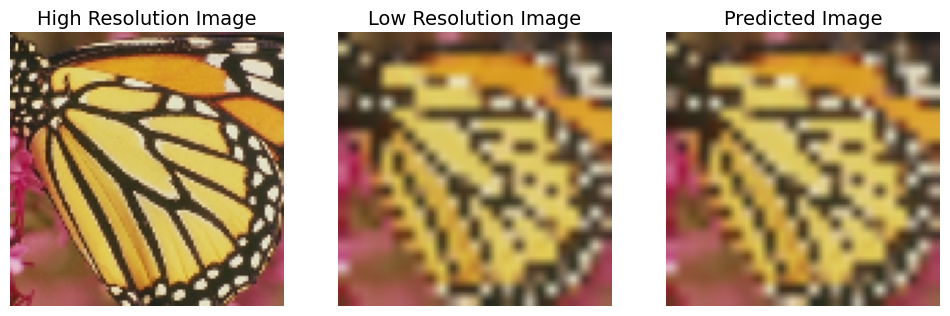

PSNR value 63.17185441666433


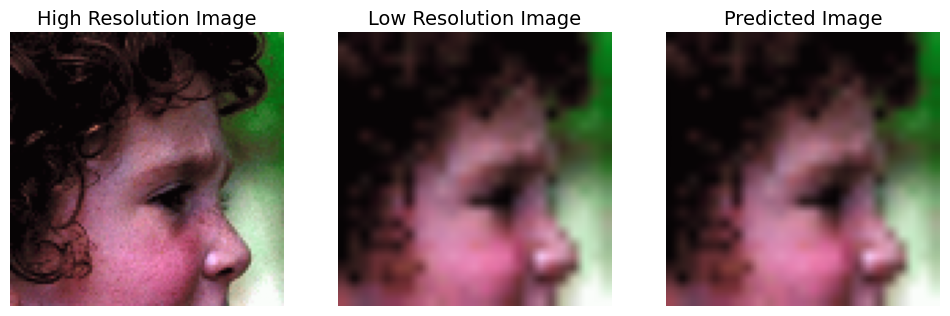

PSNR value 74.07342386808911


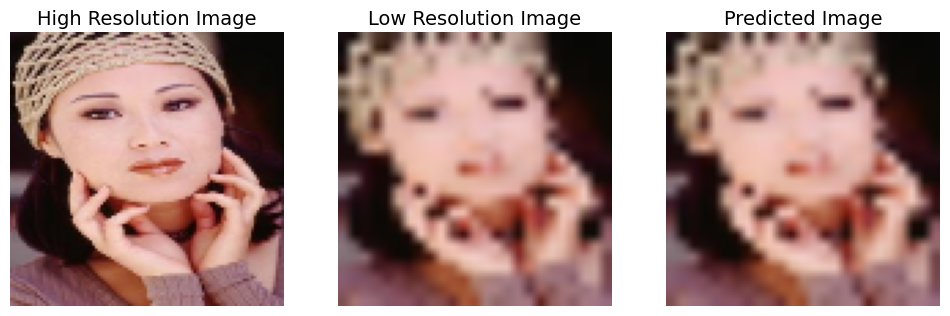

PSNR value 66.9887364618425


In [64]:
pred_l15_4 = model_l15.predict(set5_inp_4)
psnr_l15_4 = PSNR(set5_out_4,pred_l15_4)
plot_psnr(psnr_l15_4)
plot_output_final(set5_out_4,set5_inp_4,pred_l15_4,psnr_l15_4)